<h1><center> Style Transfer using CNN</center></h1>

In [1]:
from Transfer import *
import time
from collections import OrderedDict
from features_extraction import *
%matplotlib inline

We load the VGG19 model and set GPU mode. Then we generate default parameters for the transfer.

In [2]:
net, transformer = build_net()
caffe.set_mode_gpu()

args = args(net, transformer)
# Visualize parameters
args.infos()

vgg19 model successfully loaded 

content: tubingen (768, 1024, 3)
style: starry_night (448, 576, 3)
start: random
ratio: 0.001
lenghts: 512.0
style scale: 1.0
content_layer: conv4_2
style weightsOrderedDict([('conv1_1', 0.2), ('conv2_1', 0.2), ('conv3_1', 0.2), ('conv4_1', 0.2), ('conv5_1', 0.2)])


optimization parameters: 
disp : False
maxls : 20
maxiter : 500
iprint : -1
maxcor : 8
maxfun : 15000
gtol : 1e-05
eps : 1e-08
ftol : 2.22044604925e-09


See what are the available images

In [3]:
!ls ./images/

charles.jpg	     monet.jpg	      starry_night.jpg
composition_VII.jpg  natalie.jpg      starry_night_over_rhone.jpg
cri.jpg		     pastel.jpg       starry_night_over_the_rhone.jpg
darkclouds.jpg	     picasso.jpg      swan.jpg
fabric.jpg	     rug.jpg	      texture.jpg
girl.jpg	     rug_tall.jpg     the_scream.jpg
johannesburg.jpg     seated_nude.jpg  tubingen.jpg
leia.jpg	     shipwreck.jpg    yohan1.jpg
marianne.jpg	     shore.jpg	      yohan2.jpg
me.jpg		     starry.jpg


See which GPU and CPU is used

In [4]:
!nvidia-smi -L
!lscpu | grep Model

GPU 0: GeForce GTX 1060 (UUID: GPU-d0d581f0-9f18-397b-55ff-a5f8e887a525)
Model name:            Intel(R) Core(TM) i7-6700HQ CPU @ 2.60GHz


See the blobs in the network which we can use

In [5]:
for layer in reversed(net.blobs.keys()):
    print layer

pool5
conv5_4
conv5_3
conv5_2
conv5_1
pool4
conv4_4
conv4_3
conv4_2
conv4_1
pool3
conv3_4
conv3_3
conv3_2
conv3_1
pool2
conv2_2
conv2_1
pool1
conv1_2
conv1_1
data


<h1> Figure 2 </h1>
We reproduce the results in the figure 2 from [A Neural Algorithm of Artistic Style, L. Gatys, A. Ecker, M. Bethge, 2015](Hidden_landing_URL)

<h5> Shipwreck </h5> (Fig. 2 - B)

Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:13:06


      fun: 20894861858.402779
 hess_inv: <589824x589824 LbfgsInvHessProduct with dtype=float64>
      jac: array([-36.16083527, -22.29296875,   4.07370567, ...,  -8.55056763,
        15.32943153,  41.59971619])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 1007
      nit: 1001
   status: 1
  success: False
        x: array([  76.71286287,   11.7365128 ,    1.07881698, ..., -107.54451133,
       -121.68266179, -122.67891434])
output image of shape: (384, 512, 3)


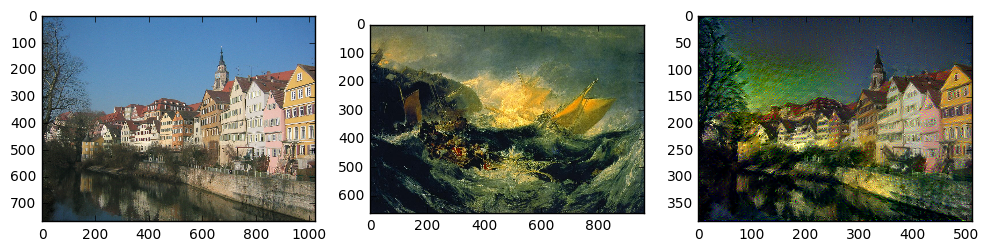

In [24]:
args.change_content('tubingen')
args.change_style('shipwreck')
args.start = 'random'
args.content_layer = 'conv4_2'
args.style_scale = 1.2
args.ratio = 1e-3
args.lengths = 512
args.optimization['maxiter'] = 1000
args.style_weights = OrderedDict([('conv1_1', 1./5),
                                 ('conv2_1', 1./5),
                                 ('conv3_1', 1./5),
                                 ('conv4_1', 1./5),
                                 ('conv5_1', 1./5)])
output = transfer(*args.get())
print_image([args.content,args.style,output])

In [25]:
save(output,args)

<h5> Starry Night </h5> (Fig. 2 - C)

Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:07:05


      fun: 27657920407.180553
 hess_inv: <589824x589824 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 30.98551559,  39.55611801,  39.67524338, ..., -35.46501923,
       -76.40628815, -36.77046585])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 521
      nit: 501
   status: 1
  success: False
        x: array([-57.58449597, -50.93445587,  -2.75651817, ..., -49.20397802,
       -46.17866026, -83.72346165])
output image of shape: (384, 512, 3)


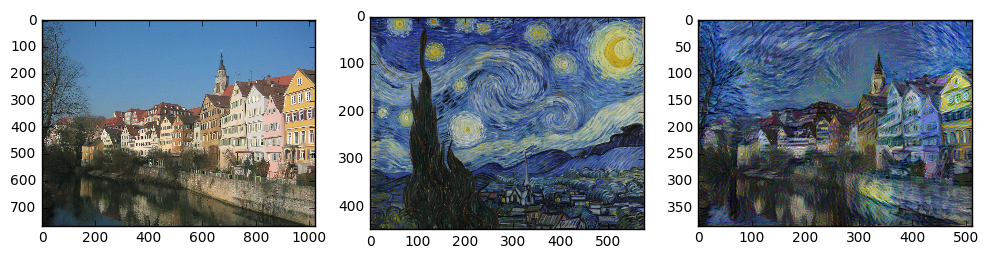

In [37]:
args.change_content('tubingen')
args.change_style('starry_night')
args.start = 'random'
args.content_layer = 'conv4_2'
args.style_scale = 1.
args.ratio = 1e-4
args.lengths = 512
args.optimization['maxiter'] = 500
args.style_weights = OrderedDict([('conv1_1', 1./5),
                                 ('conv2_1', 1./5),
                                 ('conv3_1', 1./5),
                                 ('conv4_1', 1./5),
                                 ('conv5_1', 1./5)])
output = transfer(*args.get())
print_image([args.content,args.style,output])

In [38]:
save(output,args)

<h5> The Scream </h5> (Fig. 2 - D)

Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:12:27


      fun: 28315834527.368053
 hess_inv: <589824x589824 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 26.63448524,  29.42067146, -13.13075352, ...,  22.28825188,
        14.85995674,  -1.01717377])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 1006
      nit: 1001
   status: 1
  success: False
        x: array([-104.00698793, -104.00698793,  -41.36810594, ...,  111.53451067,
        118.79746577,   32.69949978])
output image of shape: (384, 512, 3)


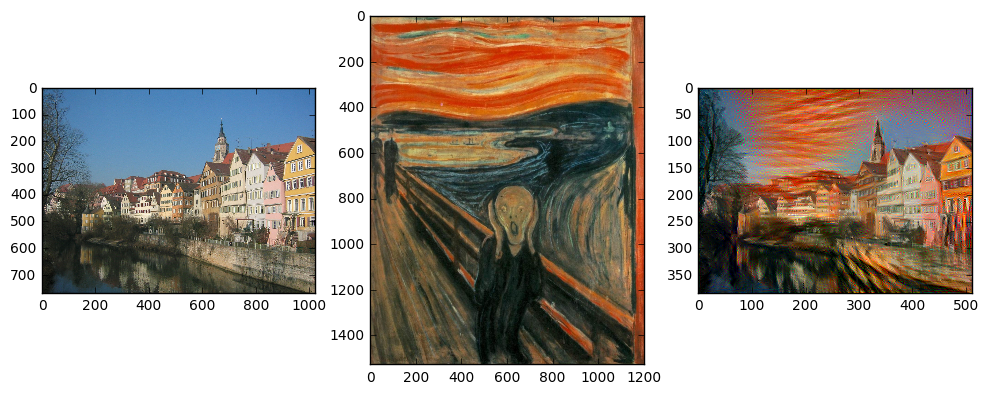

In [6]:
args.change_content('tubingen')
args.change_style('the_scream')
args.start = 'random'
args.content_layer = 'conv4_2'
args.style_scale = 1.
args.ratio = 1e-3
args.optimization['maxiter'] = 1000
args.style_weights = OrderedDict([('conv1_1', 1./5),
                                 ('conv2_1', 1./5),
                                 ('conv3_1', 1./5),
                                 ('conv4_1', 1./5),
                                 ('conv5_1', 1./5)])
output = transfer(*args.get())
print_image([args.content,args.style,output])

In [8]:
save(output,args)

<h5> Seated nude </h5> (Fig. 2 - E)

Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:12:23


      fun: 22055122805.982635
 hess_inv: <589824x589824 LbfgsInvHessProduct with dtype=float64>
      jac: array([-67.34177399, -23.95018578,  14.85638237, ..., -50.74177551,
       -39.6100769 , -33.83042908])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 1037
      nit: 1001
   status: 1
  success: False
        x: array([-22.41749404, -13.35220618, -18.98795242, ..., -86.90658069,
       -59.44924681, -54.75462285])
output image of shape: (384, 512, 3)


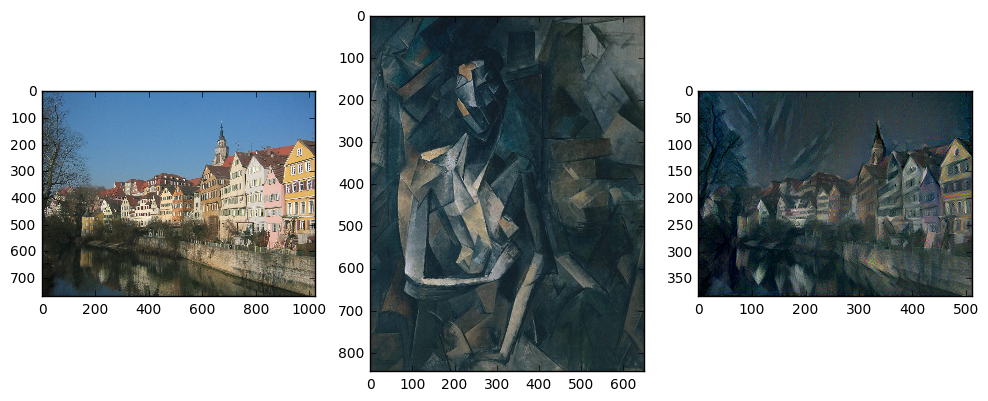

In [6]:
args.change_style('seated_nude')
args.ratio = 1e-4
args.style_scale = 1
args.start = 'random'
args.optimization['maxiter'] = 1000

output = transfer(*args.get())
print_image([args.content,args.style,output])

In [7]:
save(output,args)

<h5> Composition VII </h5> (Fig. 2 - F)

Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:13:05


      fun: 39055491219.18576
 hess_inv: <589824x589824 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 134.00547791,  166.40649414,  234.89584351, ...,   53.58642197,
        -18.3597641 ,  -49.95219421])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 1038
      nit: 1001
   status: 1
  success: False
        x: array([-104.00698793, -104.00698793, -104.00698793, ...,   93.52774066,
         77.53975551,   46.91528839])
output image of shape: (384, 512, 3)


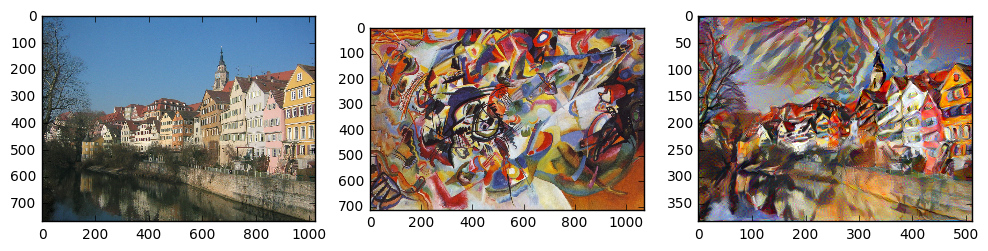

In [8]:
args.change_style('composition_VII')
args.style_scale = 1.
args.ratio = 1e-4
args.optimization['maxiter'] = 1000

output = transfer(*args.get())
print_image([args.content,args.style,output])

In [9]:
save(output,args)

We can now test on our own image. Here is a transfer on a friend's picture now we now initialize the input with the content directly in order to decrease the number of iterations.

(640, 511, 3)
(614, 490, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:08:05


      fun: 158106959408.3125
 hess_inv: <786432x786432 LbfgsInvHessProduct with dtype=float64>
      jac: array([ -845.09234619, -1086.84960938, -1294.52893066, ...,  4008.63647461,
        4671.00244141,   497.42199707])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 523
      nit: 501
   status: 1
  success: False
        x: array([ 112.11791725,    1.11209715, -103.9962261 , ..., -119.46844184,
       -122.67891434,   30.44592955])
output image of shape: (512, 512, 3)


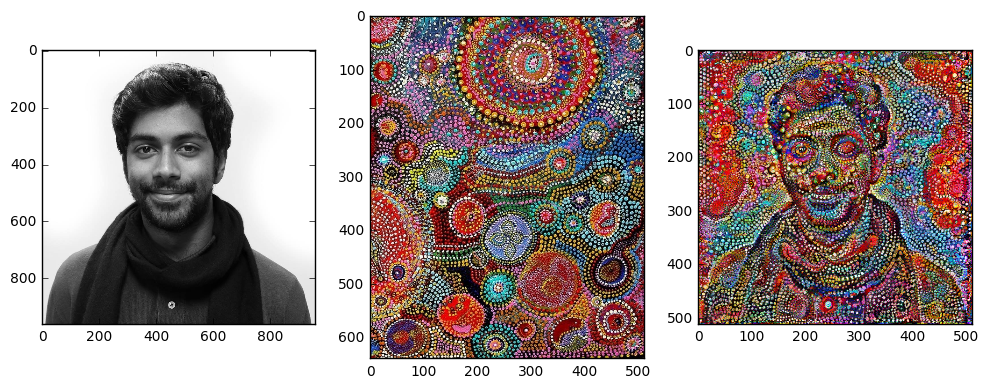

In [6]:
args.change_style('texture')
args.change_content('charles')
args.start = 'content'
args.style_scale = 1.2
args.ratio = 1e-5
args.optimization['maxiter'] = 500
output = transfer(*args.get())
print_image([args.content,args.style,output])

You can see that the transfer take into account the shadow in the picture and the structure is following its line. Now we are suppressing it by mixing in the input the content image with a bit of style image. 

(640, 511, 3)
(614, 490, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:07:54


      fun: 177064039.640625
 hess_inv: <786432x786432 LbfgsInvHessProduct with dtype=float64>
      jac: array([-0.09098828,  0.30333281,  0.03587142, ...,  2.25639606,
        1.47968054,  0.33144903])
  message: 'STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT'
     nfev: 515
      nit: 501
   status: 1
  success: False
        x: array([  43.86394497,   22.64278017,    9.94786611, ...,   11.08585596,
         64.22242597,  126.486906  ])
output image of shape: (512, 512, 3)


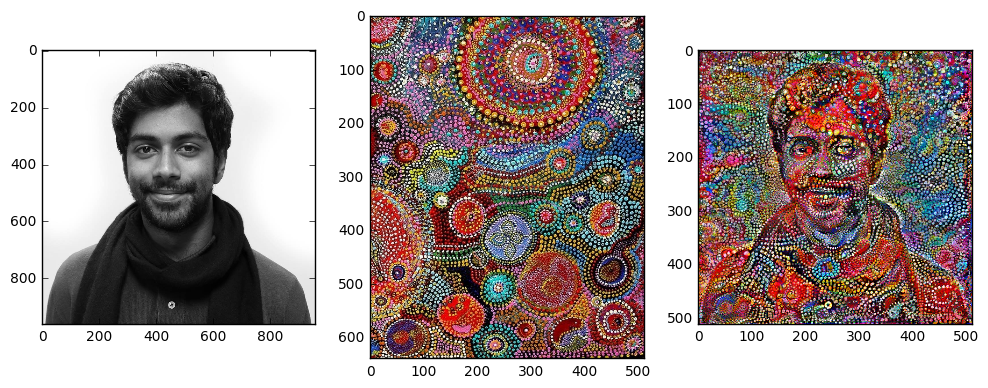

In [8]:
args.change_style('texture')
args.change_content('charles')
args.start = 'mixed'
args.ratio = 1e-2
args.style_scale = 1.2
args.content_layer = 'conv5_1'
args.style_weights = OrderedDict([('conv1_1',1./5),
                                 ('conv2_1',1./5),
                                 ('conv3_1',1./5),
                                 ('conv4_1',1./5),
                                 ('conv5_1',1./5)])
args.optimization['maxiter'] = 500
output = transfer(*args.get())
print_image([args.content,args.style,output])

We in order to see the different parameters influence, we do several transfer tuning the ratio the number of layers to represent the style picked in $\{ \textbf{conv1}_1,\textbf{conv2}_1,\textbf{conv3}_1,\textbf{conv4}_1,\textbf{conv5}_1, \}$

In [16]:
args.change_style('composition_VII')
args.change_content('tubingen')
args.style_scale = 1.2
args.lengths = 224
args.start = 'random'
args.optimization['maxiter'] = 100
args.content_layer = 'conv4_2'

w1 = OrderedDict([('conv1_1',1.)])
w2 = OrderedDict([('conv1_1',1./2),('conv2_1',1./2)])
w3 = OrderedDict([('conv1_1',1./3),('conv2_1',1./3),('conv3_1',1./3)])
w4 = OrderedDict([('conv1_1',1./4),('conv2_1',1./4),('conv3_1',1./4),('conv4_1',1./4)])
w5 = OrderedDict([('conv1_1',1./5),('conv2_1',1./5),('conv3_1',1./5),('conv4_1',1./5),('conv5_1',1./5)])

lr = [1e-5,1e-4,1e-3,1e-2]
ws = [w1,w2,w3,w4,w5]

outputs = []

(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:10


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:09


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:09


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:10


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:13


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:13


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:12


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:13


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:15


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:14


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:15


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:14


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:16


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:16


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:15


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:15


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:16


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:17


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:18


output image of shape: (168, 224, 3)
(712, 1071, 3)
(178, 268, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:00:18


output image of shape: (168, 224, 3)


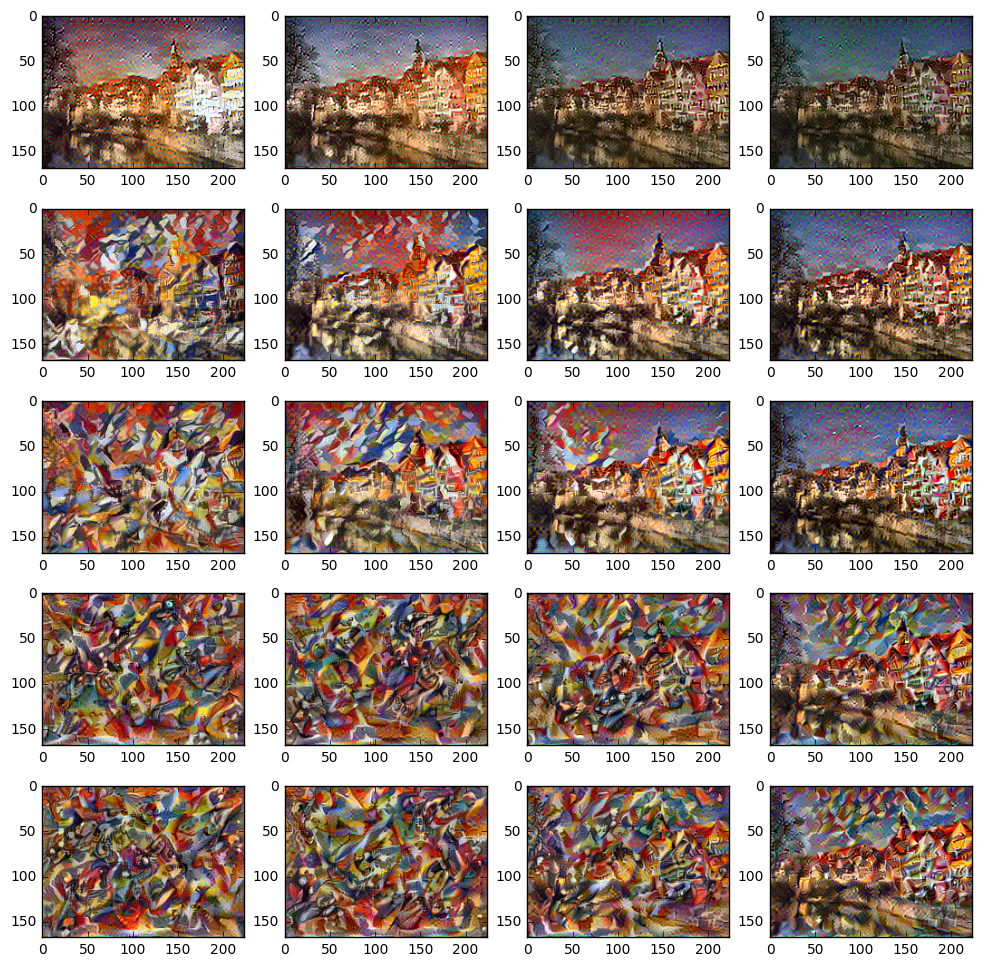

In [17]:
for k in range(5):
    for p in range(4):
        args.style_weights = ws[k]
        args.ratio = lr[p]
        outputs.append(transfer(*args.get()))
print_image(outputs,(5,4))

The higher the layers are the more we can generate correct structure (with a good scale and propagation). When we increase the ratio we manage to focus the style generation on the content.

Now what happens when we try to do the same transfer as in the paper [3]. In this, the team can filter a content image with a small image of structure.

(124, 127, 3)
(124, 127, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:04:33


output image of shape: (300, 198, 3)


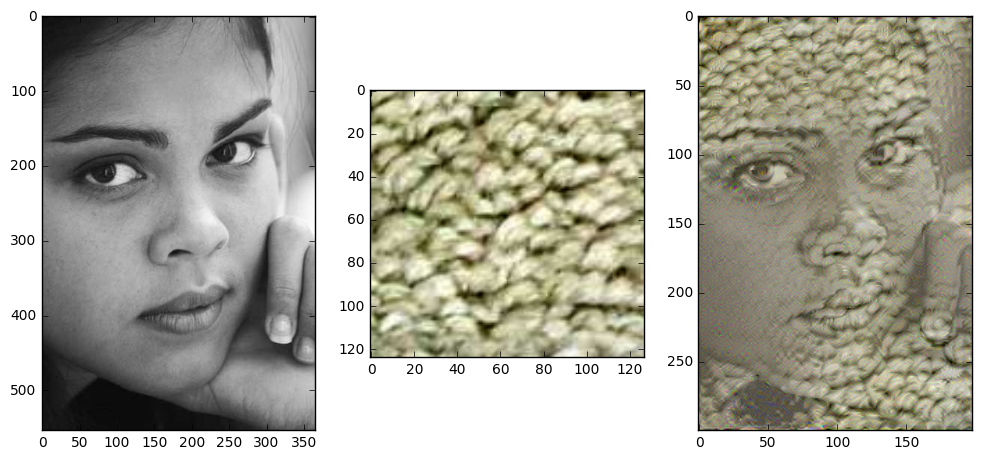

In [31]:
args.change_style('rug')
args.change_content('girl')
args.start = 'random'
args.ratio = 1e-4
args.style_scale = 127./300
args.lengths = 300
args.content_layer = 'conv4_2'
args.style_weights = OrderedDict([('conv1_1',1./5),
                                 ('conv2_1',1./5),
                                 ('conv3_1',1./5),
                                 ('conv4_1',1./5),
                                 ('conv5_1',1./5)])
args.optimization['maxiter'] = 1000
output = transfer(*args.get())
print_image([args.content,args.style,output])

Even with only 1000 iterations and a very small ratio we can't propagate the structure of the rug through the whole image. We now increase the size of the style image so that the content and the style have the same size.

(124, 127, 3)
(124, 127, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:03:15


output image of shape: (224, 148, 3)


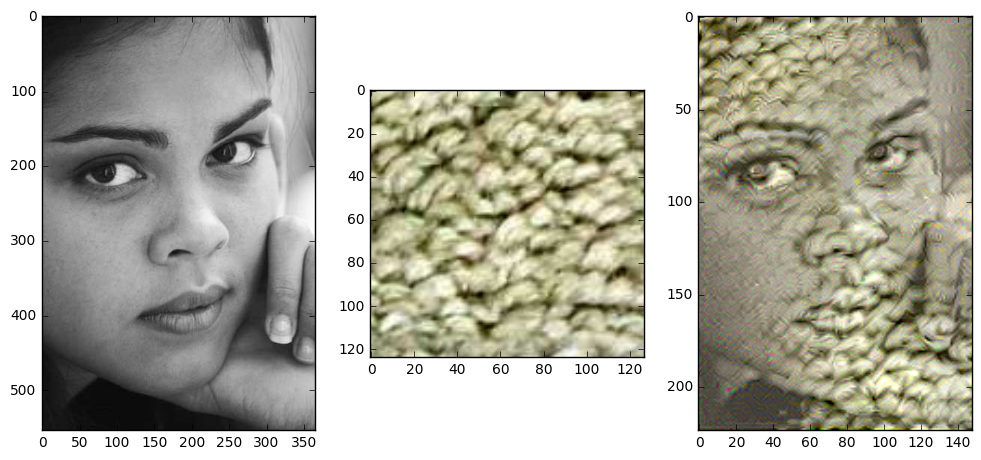

In [45]:
args.change_style('rug')
args.change_content('girl')
args.start = 'random'
args.ratio = 1e-3
args.style_scale = 127./224
args.lengths = 224
args.content_layer = 'conv4_2'
args.style_weights = OrderedDict([('conv1_1',1./5),
                                 ('conv2_1',1./5),
                                 ('conv3_1',1./5),
                                 ('conv4_1',1./5),
                                 ('conv5_1',1./5)])
args.optimization['maxiter'] = 1000
output = transfer(*args.get())
print_image([args.content,args.style,output])

As we could imagine the local structure is bigger but we can't either propagate it through the whole image. We have to use a style image with a lot more structure. For that we use a bigger similar structure and we scale into the same size of the content image.

(490, 736, 3)
(200, 300, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:04:39


output image of shape: (300, 198, 3)


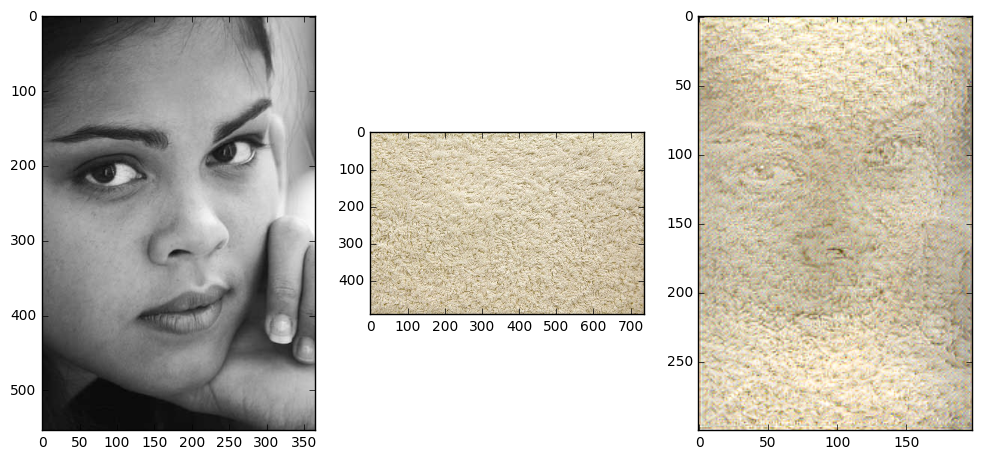

In [48]:
args.change_style('rug_tall')
args.change_content('girl')
args.start = 'random'
args.ratio = 1e-5
args.style_scale = 1.
args.lengths = 300
args.content_layer = 'conv4_2'
args.style_weights = OrderedDict([('conv1_1',1./5),
                                 ('conv2_1',1./5),
                                 ('conv3_1',1./5),
                                 ('conv4_1',1./5),
                                 ('conv5_1',1./5)])
args.optimization['maxiter'] = 1000
output = transfer(*args.get())
print_image([args.content,args.style,output])

In [49]:
save(output,args)

Here the result is what we expected.

Let's see what happens when we extend the structure of the first style image

In [29]:
structure = load('rug')
style = np.zeros((structure.shape[0]*3,structure.shape[1]*3,3))
style[:,:,0] = np.asarray(np.matlib.repmat(np.asmatrix(structure[:,:,0]),3,3))
style[:,:,1] = np.asarray(np.matlib.repmat(np.asmatrix(structure[:,:,1]),3,3))
style[:,:,2] = np.asarray(np.matlib.repmat(np.asmatrix(structure[:,:,2]),3,3))
imsave('images/rug_extended.jpg',style)

(372, 381, 3)
(293, 300, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:04:41


output image of shape: (300, 198, 3)


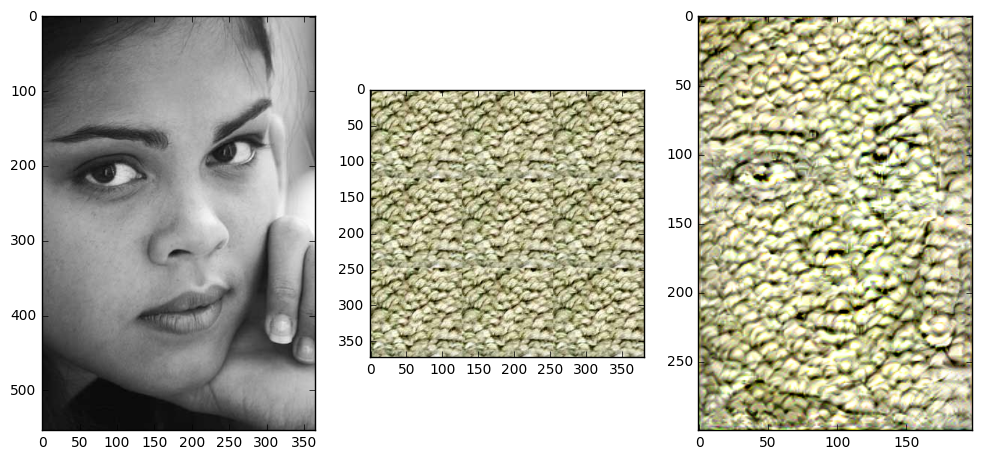

In [32]:
args.change_style('rug_extended')
args.change_content('girl')
args.start = 'content'
args.ratio = 1e-4
args.style_scale = 1.
args.lengths = 300
args.content_layer = 'conv4_2'
args.style_weights = OrderedDict([('conv1_1',1./5),
                                 ('conv2_1',1./5),
                                 ('conv3_1',1./5),
                                 ('conv4_1',1./5),
                                 ('conv5_1',1./5)])
args.optimization['maxiter'] = 1000
output = transfer(*args.get())
print_image([args.content,args.style,output])

We can conclude that small images don't have enough information on the texture (not enough pattern). Here we had to stich the same small image to get a bigger one in order to fully propagate the style on the content image.

(490, 736, 3)
(200, 300, 3)


Optimizing: 100% |||||||||||||||||||||||||||||||||||||||||||||||| Time: 0:04:39


output image of shape: (300, 198, 3)


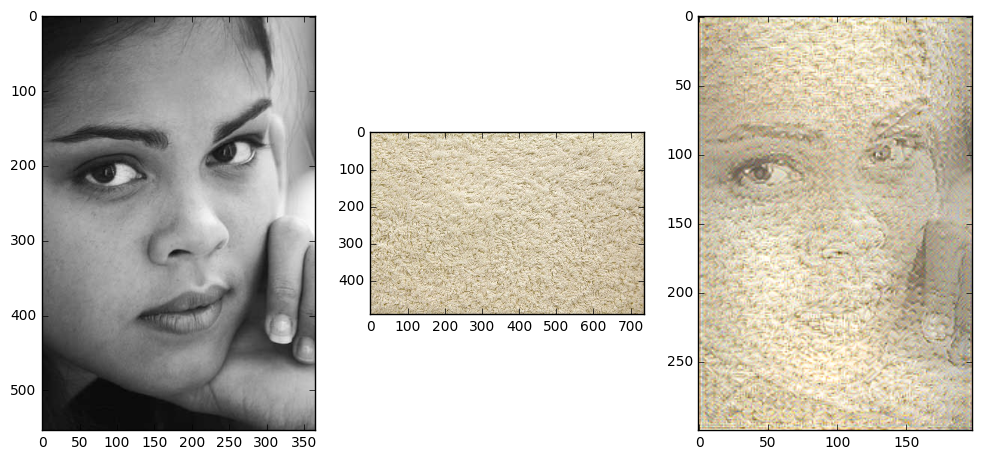

In [34]:
args.change_style('rug_tall')
args.change_content('girl')
args.start = 'random'
args.ratio = 1e-4
args.style_scale = 1.
args.lengths = 300
args.content_layer = 'conv4_2'
args.style_weights = OrderedDict([('conv1_1',1./5),
                                 ('conv2_1',1./5),
                                 ('conv3_1',1./5),
                                 ('conv4_1',1./5),
                                 ('conv5_1',1./5)])
args.optimization['maxiter'] = 1000
output = transfer(*args.get())
print_image([args.content,args.style,output])